# Cell how well tg worked on cell atlas and map ct from multiome to spatial

In [43]:
from pathlib import Path
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np  
import polars as pl
from scipy import sparse

import matplotlib.pyplot as plt
import seaborn as sns

In [137]:
adata_map = sc.read('/nfs/home/students/m.back/swarm/backend/uploads/job_1775978541189_mopitas/dumpase1/adata_map.h5ad')


In [44]:
adata_tg_scores = sc.read('/nfs/home/students/m.back/swarm/backend/uploads/job_1775978541189_mopitas/dumpase1/adata_tg_scores.h5ad')

In [162]:
adata_tg_scores.obs

,in_tissue,array_row,array_col,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,...,prob_Fibroblast_dissociated__cell_type__vessel,prob_Atrial_Cardiomyocyte_dissociated__cell_type__vessel,prob_Endothelial_cell_dissociated__cell_type__vessel,prob_Adipocyte_dissociated__cell_type__vessel,prob_Neural_cell_dissociated__cell_type__vessel,prob_Myeloid_dissociated__cell_type__vessel,prob_Lymphoid_dissociated__cell_type__vessel,prob_Lymphatic_Endothelial_cell_dissociated__cell_type__vessel,prob_Mural_cell_dissociated__cell_type__vessel,prob_Mast_cell_dissociated__cell_type__vessel
spot_id,,,,,,,,,,,,,,,,,,,,,
HCAHeartST11290662_AAACAACGAATAGTTC-1,1,0,16,HCAHeartST11290662,1663,7.416980,4484.0,8.408494,42.930419,50.178412,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HCAHeartST11290662_AAACAAGTATCTCCCA-1,1,50,102,HCAHeartST11290662,1468,7.292337,5511.0,8.614683,61.767374,66.430775,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HCAHeartST11290662_AAACAATCTACTAGCA-1,1,3,43,HCAHeartST11290662,964,6.872128,2407.0,7.786552,50.103864,56.958870,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HCAHeartST11290662_AAACACCAATAACTGC-1,1,59,19,HCAHeartST11290662,1724,7.452982,5201.0,8.556798,47.413959,54.451067,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HCAHeartST11290662_AAACAGCTTTCAGAAG-1,1,43,9,HCAHeartST11290662,1648,7.407924,4858.0,8.488588,47.694524,53.746398,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HCAHeartST11290662_TTGTTCTAGATACGCT-1,1,21,3,HCAHeartST11290662,1053,6.960348,2537.0,7.839132,47.694127,54.434371,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HCAHeartST11290662_TTGTTTCACATCCAGG-1,1,58,42,HCAHeartST11290662,1286,7.160069,2530.0,7.836370,31.027668,39.328063,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HCAHeartST11290662_TTGTTTCATTAGTCTA-1,1,60,30,HCAHeartST11290662,835,6.728629,1861.0,7.529407,46.265449,54.218162,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [143]:

base_path = Path("/nfs/home/students/m.back/swarm/backend/uploads/job_1775635064043_mopitas")

path_spatial = base_path / "HCAHeartST11290662_adata_final_annotation.h5ad"
multiome_path = base_path / "HCAHeartST11350194_HCAHeartST11445771_heart_cell_atlas_preprocessed.h5ad"
map_tg = base_path / "plasmidpoop/adata_map.h5ad"

In [145]:
map_tg_og = sc.read(map_tg)

In [3]:
spatial_adata = sc.read_h5ad(path_spatial)
spatial_adata.obs.shape

(3153, 109)

In [185]:
multiome_adata = sc.read_h5ad(multiome_path)
multiome_adata.obs.shape

/nfs/home/students/m.back/.conda/envs/mzb_python3.11/lib/python3.11/site-packages/anndata/_io/h5ad.py:266: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  return AnnData(**{


(8358, 86)

In [188]:
multiome_adata.var_names.to_list()

['ENSG00000169885',
 'ENSG00000197921',
 'ENSG00000175206',
 'ENSG00000120937',
 'ENSG00000028137',
 'ENSG00000189337',
 'ENSG00000231606',
 'ENSG00000234593',
 'ENSG00000227959',
 'ENSG00000117115',
 'ENSG00000159339',
 'ENSG00000117154',
 'ENSG00000188257',
 'ENSG00000127472',
 'ENSG00000173372',
 'ENSG00000173369',
 'ENSG00000117318',
 'ENSG00000158246',
 'ENSG00000142748',
 'ENSG00000284676',
 'ENSG00000163909',
 'ENSG00000084070',
 'ENSG00000117461',
 'ENSG00000142973',
 'ENSG00000269113',
 'ENSG00000186094',
 'ENSG00000259818',
 'ENSG00000174332',
 'ENSG00000187889',
 'ENSG00000173406',
 'ENSG00000283445',
 'ENSG00000226476',
 'ENSG00000231252',
 'ENSG00000187140',
 'ENSG00000185483',
 'ENSG00000158966',
 'ENSG00000116678',
 'ENSG00000118473',
 'ENSG00000231080',
 'ENSG00000223883',
 'ENSG00000033122',
 'ENSG00000050628',
 'ENSG00000172260',
 'ENSG00000225087',
 'ENSG00000178965',
 'ENSG00000234497',
 'ENSG00000137968',
 'ENSG00000230027',
 'ENSG00000184005',
 'ENSG00000117069',


In [7]:
# change number of columns shown when displaying pandas dataframe
pd.set_option('display.max_columns', 100)

In [4]:
map_tg_adata = sc.read_h5ad(map_tg)

In [8]:

multiome_to_spatial = {
    "Adipocyte": "",
    "Atrial Cardiomyocyte": "myocardium_atrial",
    "Ventricular Cardiomyocyte": "Ventricular_Cardiomyocyte",
    "Endothelial cell": "",
    "Lymphatic Endothelial cell": "",   # collapse if using broad vascular class
    "Fibroblast": "fibrosis",
    "Lymphoid": "",
    "Myeloid": "",
    "Mural cell": "",
    "Neural cell": "",
    "Mast cell": "",
}
spatial_to_multiome = {
    "myocardium_ventricular": "",
    "fibrosis": "",
    "cardiac_skeleton": "",
    "myocardium_atrial": "",
    "node": "",   # collapse if using broad vascular class
    "vessel": "",
}
# "Adipocyte", "Atrial Cardiomyocyte", "Ventricular Cardiomyocyte", "Endothelial cell", "Lymphatic Endothelial cell", "Fibroblast", "Lymphoid", "Myeloid", "Mural cell", "Neural cell", "Mast cell"
# "myocardium_ventricular", "fibrosis", "cardiac_skeleton", "myocardium_atrial", "node", "vessel", "other"


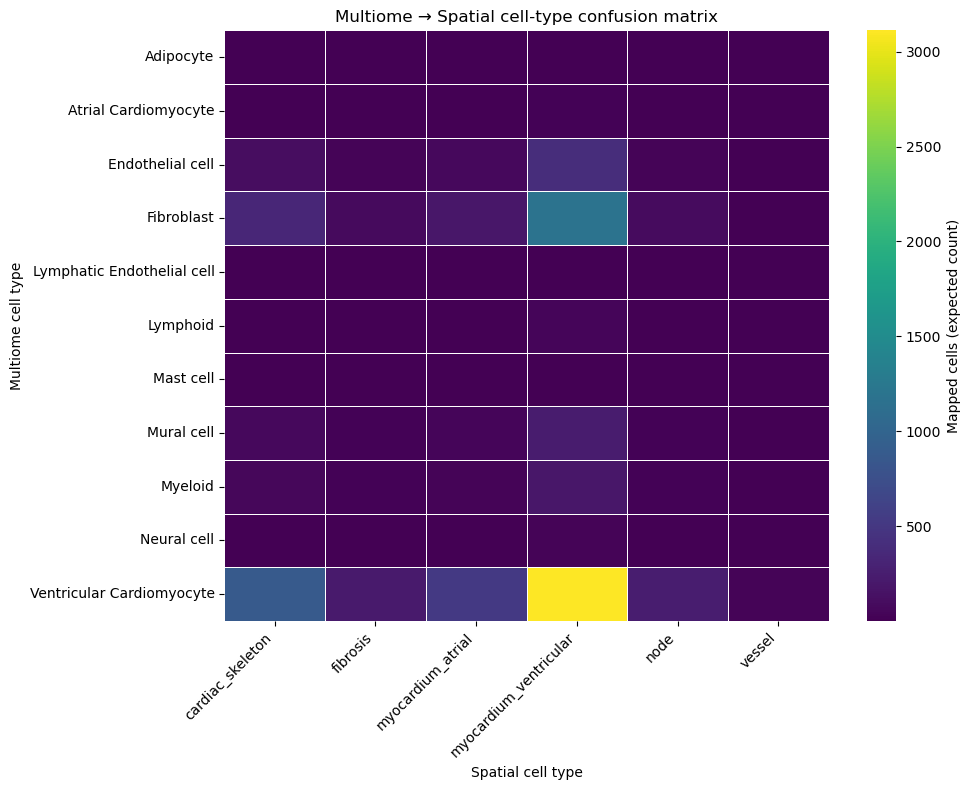

In [4]:
# cell labels
obs_ct = map_tg_adata.obs["cell_type"].astype("category")
var_ct = map_tg_adata.var["cell_type"].astype("category")

# one-hot encodings
O = pd.get_dummies(obs_ct).to_numpy()   # (n_cells, n_multiome_types)
V = pd.get_dummies(var_ct).to_numpy()   # (n_spots, n_spatial_types)

# mapping matrix
X = map_tg_adata.X

# normalize each cell's mapping weights to sum to 1
# so aggregated values are "number of cells mapped" (expected counts)
if sparse.issparse(X):
    X = X.tocsr()
    row_sum = np.asarray(X.sum(axis=1)).ravel()
    row_sum[row_sum == 0] = 1.0
    Xn = X.multiply(1.0 / row_sum[:, None])

    confusion = (O.T @ Xn @ V)
    confusion = confusion.toarray() if sparse.issparse(confusion) else np.asarray(confusion)
else:
    X = np.asarray(X)
    row_sum = X.sum(axis=1, keepdims=True)
    row_sum[row_sum == 0] = 1.0
    Xn = X / row_sum
    confusion = O.T @ Xn @ V

# DataFrame: rows = multiome cell type, cols = spatial cell type
df = pd.DataFrame(
    confusion,
    index=pd.get_dummies(obs_ct).columns,
    columns=pd.get_dummies(var_ct).columns
)

# optional integer-like view
confusion_matrix = df.round(2)

plt.figure(figsize=(10, 8))
sns.heatmap(confusion_matrix, cmap="viridis", linewidths=0.5, cbar_kws={"label": "Mapped cells (expected count)"})
plt.title("Multiome → Spatial cell-type confusion matrix")
plt.xlabel("Spatial cell type")
plt.ylabel("Multiome cell type")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [ ]:
confusion_matrix

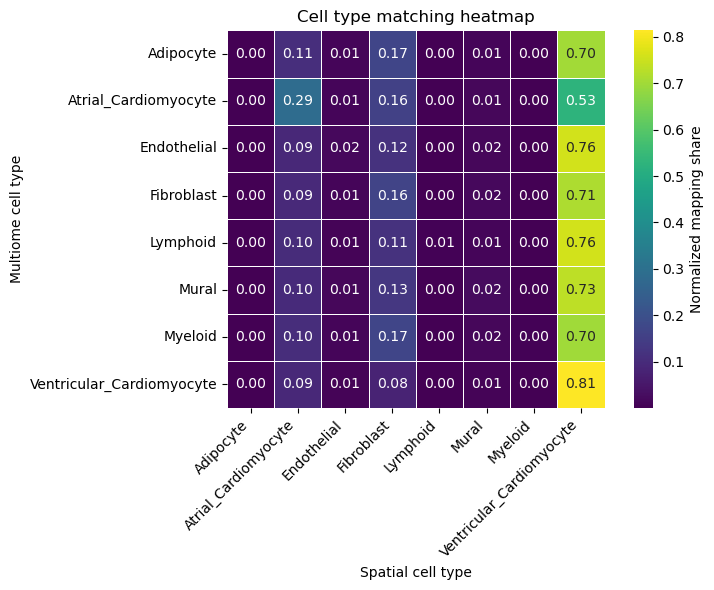

In [18]:


plt.figure(figsize=(8, 6))
sns.heatmap(
    confusion_inter_norm,
    annot=True,
    fmt=".2f",
    cmap="viridis",
    linewidths=0.5,
    square=True,
    cbar_kws={"label": "Normalized mapping share"}
)

plt.title("Cell type matching heatmap")
plt.xlabel("Spatial cell type")
plt.ylabel("Multiome cell type")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [19]:
multiome_to_coarse = {
    "Adipocyte": "Adipocyte",
    "Atrial Cardiomyocyte": "Cardiomyocyte",
    "Ventricular Cardiomyocyte": "Cardiomyocyte",
    "Endothelial cell": "Endothelial",
    "Lymphatic Endothelial cell": "Endothelial",
    "Fibroblast": "Fibroblast",
    "Lymphoid": "Lymphoid",
    "Myeloid": "Myeloid",
    "Mural cell": "Mural",
    "Neural cell": "Neural",
    "Mast cell": "Mast",
}

spatial_to_coarse = {
    "Adipocyte": "Adipocyte",
    "Atrial_Cardiomyocyte": "Cardiomyocyte",
    "Ventricular_Cardiomyocyte": "Cardiomyocyte",
    "Conduction_Cardiomyocyte": "Cardiomyocyte",
    "Endothelial": "Endothelial",
    "Fibroblast": "Fibroblast",
    "Dendritic": "Myeloid",
    "Monocyte_Macrophage": "Myeloid",
    "Smooth_Muscle": "Mural",
    "T_cell": "Lymphoid",
}

In [20]:
row_coarse = pd.Index(df.index.map(multiome_to_coarse), name="multiome_coarse")
col_coarse = pd.Index(df.columns.map(spatial_to_coarse), name="spatial_coarse")

df_coarse = df.copy()
df_coarse.index = row_coarse
df_coarse.columns = col_coarse

confusion_coarse = df_coarse.groupby(level=0).sum()
confusion_coarse = confusion_coarse.T.groupby(level=0).sum().T
confusion_coarse_norm = confusion_coarse.div(confusion_coarse.sum(axis=1), axis=0)

shared_labels = sorted(set(confusion_coarse_norm.index).intersection(confusion_coarse_norm.columns))

confusion_inter = confusion_coarse_norm.reindex(
    index=shared_labels,
    columns=shared_labels,
    fill_value=0
)

confusion_inter_norm = confusion_inter.div(
    confusion_inter.sum(axis=1).replace(0, np.nan),
    axis=0
).fillna(0)

diag_share_inter = pd.Series(
    np.diag(confusion_inter_norm),
    index=confusion_inter_norm.index
)

print(diag_share_inter)
print("mean diagonal share:", diag_share_inter.mean())

multiome_coarse
Adipocyte        0.000603
Cardiomyocyte    0.904151
Endothelial      0.018967
Fibroblast       0.163264
Lymphoid         0.005272
Mural            0.024724
Myeloid          0.003494
dtype: float32
mean diagonal share: 0.16006783


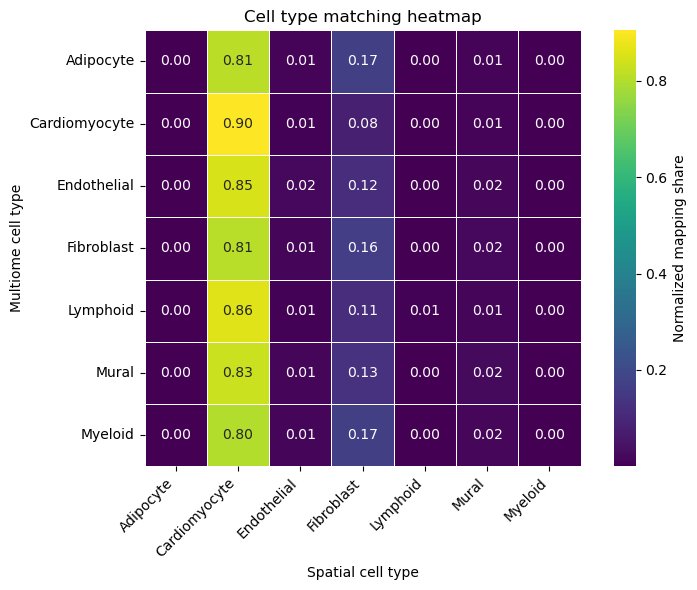

In [21]:


plt.figure(figsize=(8, 6))
sns.heatmap(
    confusion_inter_norm,
    annot=True,
    fmt=".2f",
    cmap="viridis",
    linewidths=0.5,
    square=True,
    cbar_kws={"label": "Normalized mapping share"}
)

plt.title("Cell type matching heatmap")
plt.xlabel("Spatial cell type")
plt.ylabel("Multiome cell type")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## mapping back

In [134]:
def map_dissociated_annos_to_spatial(map_tg_adata, obs_anno_col="cell_type"):
        
    X = map_tg_adata.X
    cell_type = map_tg_adata.obs[obs_anno_col]

    # keep category order exactly as stored
    cats = cell_type.cat.categories

    # one-hot encode cell types: shape (n_cells, n_types)
    onehot = pd.get_dummies(cell_type).reindex(columns=cats, fill_value=0)

    # convert to array/sparse matrix
    if sparse.issparse(X):
        spot_type_sum = onehot.to_numpy().T @ X   # shape: (n_types, n_spots)
        spot_type_sum = spot_type_sum.toarray() if sparse.issparse(spot_type_sum) else np.asarray(spot_type_sum)
    else:
        spot_type_sum = onehot.to_numpy().T @ np.asarray(X)  # shape: (n_types, n_spots)

    # make DataFrame: rows = spots, cols = cell types
    spot_type_sum_df = pd.DataFrame(
        spot_type_sum.T,
        index=map_tg_adata.var_names,   # spots
        columns=cats                    # cell type categories
    )

    spot_type_prob_df = spot_type_sum_df.div(spot_type_sum_df.sum(axis=1), axis=0).fillna(0)
    map_tg_adata.varm[f"{obs_anno_col}_dissociated_sum"] = spot_type_sum_df.to_numpy()
    map_tg_adata.varm[f"{obs_anno_col}_dissociated_prob"] = spot_type_prob_df.to_numpy()
    map_tg_adata.uns[f"{obs_anno_col}_dissociated_columns"] = list(cats)


    cell_type_prob = map_tg_adata.varm[f"{obs_anno_col}_dissociated_prob"]
    cell_type_names = np.array(map_tg_adata.uns[f"{obs_anno_col}_dissociated_columns"])

    max_idx = np.argmax(cell_type_prob, axis=1)
    map_tg_adata.var[f"{obs_anno_col}_dissociated_max_prob"] = cell_type_names[max_idx]


    return map_tg_adata

In [12]:
map_tg_adata_mapped = map_dissociated_annos_to_spatial(map_tg_adata, obs_anno_col="cell_type")

In [ ]:
map_tg_adata_mapped.var.head()

### heart data

In [32]:
heart_spatial_adata = sc.read_h5ad(path_spatial)

In [9]:
map_tg_adata_heart = sc.read_h5ad(map_tg)

In [34]:
map_tg_adata_heart.obs["cell_type"]

AGGTATTGTCTTTGAC-1    Ventricular Cardiomyocyte
ACTTACTTCATTAGTG-1    Ventricular Cardiomyocyte
CCTTCAATCAGCATTA-1    Ventricular Cardiomyocyte
ATGTTGTCAATACTGT-1    Ventricular Cardiomyocyte
CTTCAATTCATTTGTC-1    Ventricular Cardiomyocyte
                                ...            
CTTTCTTGTAGCTGGT-1                    Adipocyte
AGTTATGTCTCAATGA-1             Endothelial cell
TAGTGTGGTTAGGCGT-1    Ventricular Cardiomyocyte
TGGACTAGTTGTTCAC-1                  Neural cell
CGAACAAAGGAAGCAC-1             Endothelial cell
Name: cell_type, Length: 8358, dtype: category
Categories (11, object): ['Adipocyte', 'Atrial Cardiomyocyte', 'Endothelial cell', 'Fibroblast', ..., 'Mural cell', 'Myeloid', 'Neural cell', 'Ventricular Cardiomyocyte']

In [13]:
map_tg_adata_heart_mapped = map_dissociated_annos_to_spatial(map_tg_adata_heart)

In [36]:
map_tg_adata_heart_mapped

AnnData object with n_obs × n_vars = 8358 × 3153
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'leiden_scArches', 'peak_sangerID', 'peak_combinedID', 'peak_donor', 'peak_donor_type', 'peak_region', 'peak_region_finest', 'peak_age', 'peak_gender', 'peak_facility', 'peak_cell_or_nuclei', 'peak_modality',

In [37]:
map_tg_adata_heart_mapped.var["cell_type_dissociated_max_prob"].value_counts()

cell_type_dissociated_max_prob
Ventricular Cardiomyocyte    3035
Fibroblast                    118
Name: count, dtype: int64

In [38]:
map_tg_adata_heart_mapped.varm["cell_type_dissociated_prob"]

array([[2.0636476e-04, 2.4311757e-03, 4.8035063e-02, ..., 5.0803643e-02,
        5.6944722e-03, 6.3026059e-01],
       [8.7939057e-04, 6.9752443e-03, 3.6121406e-02, ..., 3.6911823e-02,
        1.9122799e-03, 6.6562206e-01],
       [1.7778076e-03, 1.8560318e-03, 5.7945523e-02, ..., 2.9071668e-02,
        3.8424728e-03, 6.9510847e-01],
       ...,
       [7.8549038e-04, 5.3139497e-04, 6.8745144e-02, ..., 2.4406530e-02,
        7.1626981e-03, 6.4336193e-01],
       [2.1200312e-05, 8.1699877e-04, 1.2979794e-01, ..., 2.3746630e-02,
        5.3610271e-03, 6.6364521e-01],
       [5.6201557e-04, 2.9427543e-02, 6.7203201e-02, ..., 1.8131875e-02,
        4.8478539e-03, 5.8440465e-01]], shape=(3153, 11), dtype=float32)

In [141]:
def plot_cell_type_probs_on_spatial(map_tg_adata, obs_anno_col="cell_type"):

    # cell-type probabilities: shape (n_spots, n_cell_types)
    prob = map_tg_adata.varm[f"{obs_anno_col}_dissociated_prob"]
    cell_types = list(map_tg_adata.uns[f"{obs_anno_col}_dissociated_columns"])

    # ---- choose spot coordinates ----
    # adapt this depending on where your spatial coordinates are stored
    if {"x", "y"}.issubset(map_tg_adata.var.columns):
        coords = map_tg_adata.var[["x", "y"]].to_numpy()
    elif {"array_col", "array_row"}.issubset(map_tg_adata.var.columns):
        coords = map_tg_adata.var[["array_col", "array_row"]].to_numpy()
    else:
        raise ValueError(
            "Could not find spatial coordinates in map_tg_adata.var. "
            "Expected columns like ['x','y'] or ['array_col','array_row']."
        )

    x = coords[:, 0]
    y = coords[:, 1]

    # ---- plot one panel per cell type ----
    n_ct = prob.shape[1]
    ncols = 4
    nrows = int(np.ceil(n_ct / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows))
    axes = np.ravel(axes)

    for i, ct in enumerate(cell_types):
        ax = axes[i]
        sc = ax.scatter(
            x, y,
            c=prob[:, i],
            s=20,
            cmap="viridis"
        )
        ax.set_title(f"{obs_anno_col} {ct}")
        ax.set_aspect("equal")
        ax.invert_yaxis()   # usually useful for spatial data
        ax.set_xticks([])
        ax.set_yticks([])
        plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)

    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

In [5]:
def plot_cell_type_probs_on_spatial_shared_axis(map_tg_adata, obs_anno_col="cell_type"):

    # cell-type probabilities: shape (n_spots, n_cell_types)
    prob = map_tg_adata.varm[f"{obs_anno_col}_dissociated_prob"]
    cell_types = list(map_tg_adata.uns[f"{obs_anno_col}_dissociated_columns"])

    # ---- choose spot coordinates ----
    # adapt this depending on where your spatial coordinates are stored
    if {"x", "y"}.issubset(map_tg_adata.var.columns):
        coords = map_tg_adata.var[["x", "y"]].to_numpy()
    elif {"array_col", "array_row"}.issubset(map_tg_adata.var.columns):
        coords = map_tg_adata.var[["array_col", "array_row"]].to_numpy()
    else:
        raise ValueError(
            "Could not find spatial coordinates in map_tg_adata.var. "
            "Expected columns like ['x','y'] or ['array_col','array_row']."
        )

    x = coords[:, 0]
    y = coords[:, 1]

    # ---- plot one panel per cell type ----
    n_ct = prob.shape[1]
    ncols = 4
    nrows = int(np.ceil(n_ct / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows))
    axes = np.ravel(axes)

    for i, ct in enumerate(cell_types):
        ax = axes[i]
        sc = ax.scatter(
            x, y,
            c=prob[:, i],
            s=5,
            cmap="viridis",
            vmin=0,
            vmax=1
        )
        ax.set_title(f"{obs_anno_col} {ct}")
        ax.set_aspect("equal")
        ax.invert_yaxis()   # usually useful for spatial data
        ax.set_xticks([])
        ax.set_yticks([])
        plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)

    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

In [9]:
def plot_cell_type_probs_on_spatial_histograms(map_tg_adata, obs_anno_col="cell_type"):

    prob = map_tg_adata.varm[f"{obs_anno_col}_dissociated_prob"]
    cell_types = list(map_tg_adata.uns[f"{obs_anno_col}_dissociated_columns"])

    n_ct = len(cell_types)
    ncols = 4
    nrows = int(np.ceil(n_ct / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 3*nrows))
    axes = np.ravel(axes)

    for i, ct in enumerate(cell_types):
        ax = axes[i]
        ax.hist(prob[:, i], bins=50)
        ax.set_title(str(ct))
        ax.set_xlabel("probability")
        ax.set_ylabel("n spots")

    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()

In [109]:
w_cell2loc.uns["spatial"]["HCAHeartST11290662"].keys()

dict_keys(['images', 'metadata', 'scalefactors'])

In [127]:
broad_map = {
   # conduction / nodal cardiomyocytes
   'AVN_P_cell': 'Conduction_Cardiomyocyte',
   'AVN_bundle_cell': 'Conduction_Cardiomyocyte',
   'SAN_P_cell': 'Conduction_Cardiomyocyte',
   # atrial / ventricular cardiomyocytes
   'aCM1': 'Atrial_Cardiomyocyte',
   'aCM2': 'Atrial_Cardiomyocyte',
   'aCM3': 'Atrial_Cardiomyocyte',
   'aCM4': 'Atrial_Cardiomyocyte',
   'aCM5': 'Atrial_Cardiomyocyte',
   'vCM1': 'Ventricular_Cardiomyocyte',
   'vCM2': 'Ventricular_Cardiomyocyte',
   'vCM3_stressed': 'Ventricular_Cardiomyocyte',
   'vCM4': 'Ventricular_Cardiomyocyte',
   'vCM5': 'Ventricular_Cardiomyocyte',
   # Purkinje / specialized conduction-like
   'PC1_vent': 'Purkinje_like',
   'PC2_atria': 'Purkinje_like',
   'PC3_str': 'Purkinje_like',
   'PC4_CMC-like': 'Purkinje_like',
   # endothelial
   'EC1_cap': 'Endothelial',
   'EC2_cap': 'Endothelial',
   'EC3_cap': 'Endothelial',
   'EC4_immune': 'Endothelial',
   'EC5_art': 'Endothelial',
   'EC6_ven': 'Endothelial',
   'EC7_endocardial': 'Endothelial',
   'EC8_ln': 'Endothelial',
   'EC9_FB-like': 'Endothelial',
   'EC10_CMC-like': 'Endothelial',
   # fibroblasts
   'FB1': 'Fibroblast',
   'FB2': 'Fibroblast',
   'FB3': 'Fibroblast',
   'FB4_activated': 'Fibroblast',
   'FB5': 'Fibroblast',
   'FB6': 'Fibroblast',
   # smooth muscle / mural / mesothelial
   'SMC1_basic': 'Smooth_Muscle',
   'SMC2_art': 'Smooth_Muscle',
   'Meso': 'Mesothelial',
   # adipocytes
   'Adip1': 'Adipocyte',
   'Adip2': 'Adipocyte',
   'Adip3': 'Adipocyte',
   'Adip4': 'Adipocyte',
   # immune: B / plasma
   'B': 'B_cell',
   'B_plasma': 'Plasma_cell',
   # immune: T / NK / ILC
   'CD4+T_Tfh': 'T_cell',
   'CD4+T_Th1': 'T_cell',
   'CD4+T_Th2': 'T_cell',
   'CD4+T_act': 'T_cell',
   'CD4+T_naive': 'T_cell',
   'CD4+T_reg': 'T_cell',
   'CD8+T_cytox': 'T_cell',
   'CD8+T_em': 'T_cell',
   'CD8+T_te': 'T_cell',
   'CD8+T_trans': 'T_cell',
   'gdT': 'T_cell',
   'MAIT-like': 'T_cell',
   'T/NK_cycling': 'T_NK_cell',
   'NK_CD16hi': 'NK_cell',
   'NK_CD56hi': 'NK_cell',
   'ILC': 'ILC',
   # myeloid
   'CD14+Mo': 'Monocyte_Macrophage',
   'CD16+Mo': 'Monocyte_Macrophage',
   'LYVE1+IGF1+MP': 'Monocyte_Macrophage',
   'LYVE1+MP_cycling': 'Monocyte_Macrophage',
   'LYVE1+TIMD4+MP': 'Monocyte_Macrophage',
   'MoMP': 'Monocyte_Macrophage',
   'DC': 'Dendritic',
   'Neut': 'Neutrophil',
   'Mast': 'Mast_cell',
   # neural / glial / Schwann
   'NC1_glial': 'Glial_Schwann',
   'NC2_glial_NGF+': 'Glial_Schwann',
   'NC3_glial': 'Glial_Schwann',
   'NC5_glial': 'Glial_Schwann',
   'NC6_schwann': 'Glial_Schwann',
}



0 B_cell
1 Mesothelial
2 Atrial_Cardiomyocyte
3 Neutrophil
4 Adipocyte
5 Plasma_cell
6 Purkinje_like
7 NK_cell
8 Monocyte_Macrophage
9 Conduction_Cardiomyocyte
10 T_cell
11 Endothelial
12 ILC
13 Dendritic
14 Smooth_Muscle
15 Fibroblast
16 Glial_Schwann
17 T_NK_cell
18 Ventricular_Cardiomyocyte
19 Mast_cell


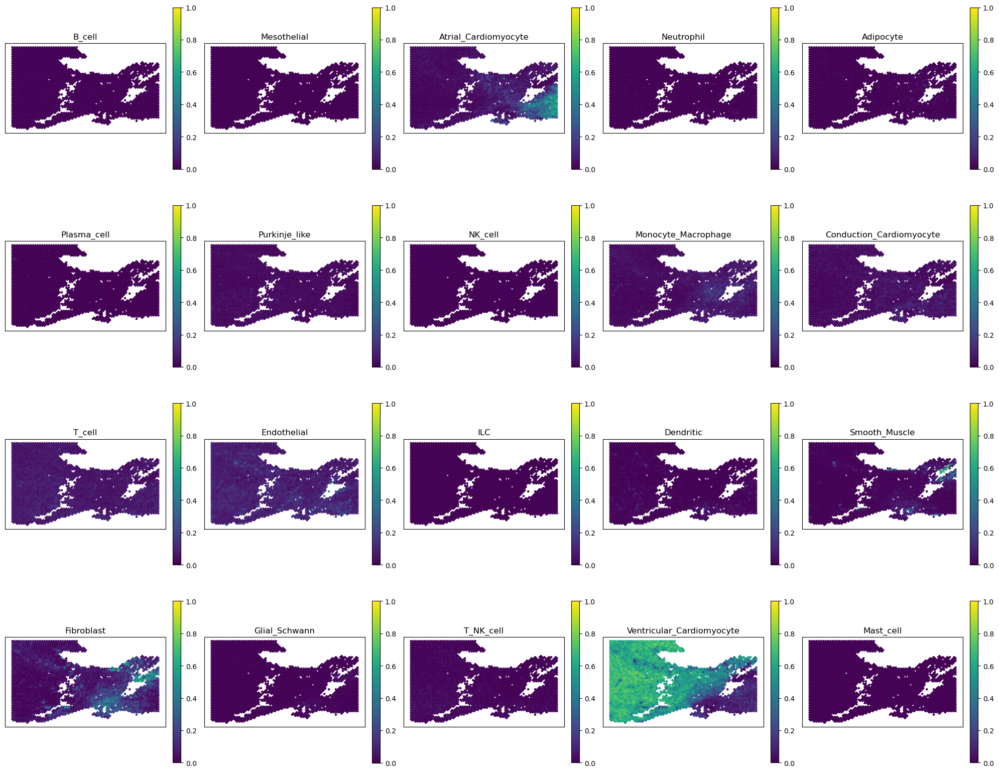

In [146]:
prob = w_cell2loc.obsm["prop"]
cell_types = list(w_cell2loc.obsm["prop"].columns)

# ---- choose spot coordinates ----
# adapt this depending on where your spatial coordinates are stored

#spatial coords in w_cell2loc.uns["spatial"]
x = w_cell2loc.obs["array_col"].to_numpy()
y = w_cell2loc.obs["array_row"].to_numpy()


# ---- plot one panel per cell type ----
# n_ct = prob.shape[1]
n_ct = len(set(broad_map.values()))
ncols = 5
nrows = int(np.ceil(n_ct / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows))
axes = np.ravel(axes)

for i, ct in enumerate(set(broad_map.values())):
    print(i, ct)
    corresponding_fine = [k for k, v in broad_map.items() if v == ct]
    ct_prob = prob[ [fine for fine in corresponding_fine if fine in cell_types]].sum(axis=1)
    ax = axes[i]
#for i, ct in enumerate(cell_types):
    ax = axes[i]
    sc = ax.scatter(
        x, y,
        # c = prob[ct],
        c=ct_prob,
        s=5,
        cmap="viridis",
        vmin=0,
        vmax=1
    )
    # if prob[ct].max() == 0 or np.isnan(prob[ct]).all():
    #     continue  # skip plotting if no signal for this cell type
    # if ct_prob.max() == 0 or np.isnan(ct_prob).all():
    #     continue  # skip plotting if no signal for this cell type
    ax.set_title(f"{ct}")
    ax.set_aspect("equal")
    ax.invert_yaxis()   # usually useful for spatial data
    ax.set_xticks([])
    ax.set_yticks([])
    plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)

for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

0 B_cell
1 Mesothelial
2 Atrial_Cardiomyocyte
3 Neutrophil
4 Adipocyte
5 Plasma_cell
6 Purkinje_like
7 NK_cell
8 Monocyte_Macrophage
9 Conduction_Cardiomyocyte
10 T_cell
11 Endothelial
12 ILC
13 Dendritic
14 Smooth_Muscle
15 Fibroblast
16 Glial_Schwann
17 T_NK_cell


18 Ventricular_Cardiomyocyte
19 Mast_cell


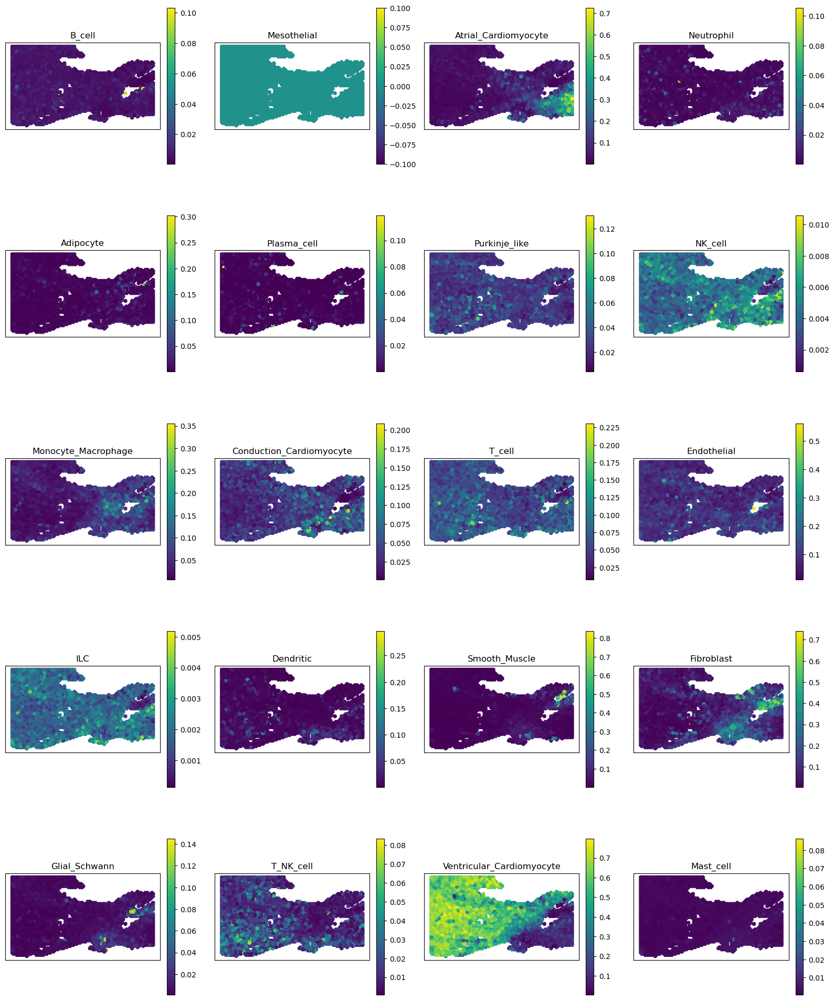

In [ ]:
prob = w_cell2loc.obsm["prop"]
cell_types = list(w_cell2loc.obsm["prop"].columns)

# ---- choose spot coordinates ----
# adapt this depending on where your spatial coordinates are stored

#spatial coords in w_cell2loc.uns["spatial"]
x = w_cell2loc.obs["array_col"].to_numpy()
y = w_cell2loc.obs["array_row"].to_numpy()


# ---- plot one panel per cell type ----
# n_ct = prob.shape[1]
n_ct = len(set(broad_map.values()))
ncols = 4
nrows = int(np.ceil(n_ct / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows))
axes = np.ravel(axes)

for i, ct in enumerate(set(broad_map.values())):
    print(i, ct)
    corresponding_fine = [k for k, v in broad_map.items() if v == ct]
    ct_prob = prob[ [fine for fine in corresponding_fine if fine in cell_types]].sum(axis=1)
    ax = axes[i]
#for i, ct in enumerate(cell_types):
    ax = axes[i]
    sc = ax.scatter(
        x, y,
        # c = prob[ct],
        c=ct_prob,
        s=20,
        cmap="viridis"
    )
    # if prob[ct].max() == 0 or np.isnan(prob[ct]).all():
    #     continue  # skip plotting if no signal for this cell type
    # if ct_prob.max() == 0 or np.isnan(ct_prob).all():
    #     continue  # skip plotting if no signal for this cell type
    ax.set_title(f"{ct}")
    ax.set_aspect("equal")
    ax.invert_yaxis()   # usually useful for spatial data
    ax.set_xticks([])
    ax.set_yticks([])
    plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)

for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

In [100]:
w_cell2loc.obsm["prop"].columns

Index(['Adip1', 'Adip2', 'Adip3', 'B', 'B_plasma', 'CD14+Mo', 'CD16+Mo',
       'CD4+T_act', 'CD4+T_naive', 'CD8+T_cytox', 'CD8+T_em', 'CD8+T_te',
       'CD8+T_trans', 'DC', 'EC10_CMC-like', 'EC1_cap', 'EC2_cap', 'EC3_cap',
       'EC4_immune', 'EC5_art', 'EC6_ven', 'EC7_endocardial', 'EC8_ln', 'FB1',
       'FB2', 'FB3', 'FB4_activated', 'FB5', 'FB6', 'ILC', 'LYVE1+IGF1+MP',
       'LYVE1+MP_cycling', 'LYVE1+TIMD4+MP', 'MAIT-like', 'Mast', 'Meso',
       'MoMP', 'NC1_glial', 'NC2_glial_NGF+', 'NK_CD16hi', 'NK_CD56hi', 'Neut',
       'PC1_vent', 'PC2_atria', 'PC3_str', 'SAN_P_cell', 'SMC1_basic',
       'SMC2_art', 'T/NK_cycling', 'aCM1', 'aCM2', 'aCM3', 'aCM4',
       'AVN_bundle_cell', 'PC4_CMC-like', 'vCM1', 'vCM2', 'vCM3_stressed',
       'vCM4', 'vCM5', 'AVN_P_cell', 'CD4+T_Tfh', 'CD4+T_Th1', 'CD4+T_Th2',
       'CD4+T_reg', 'NC5_glial', 'aCM5', 'Adip4', 'NC3_glial', 'NC6_schwann',
       'EC9_FB-like', 'gdT'],
      dtype='object')

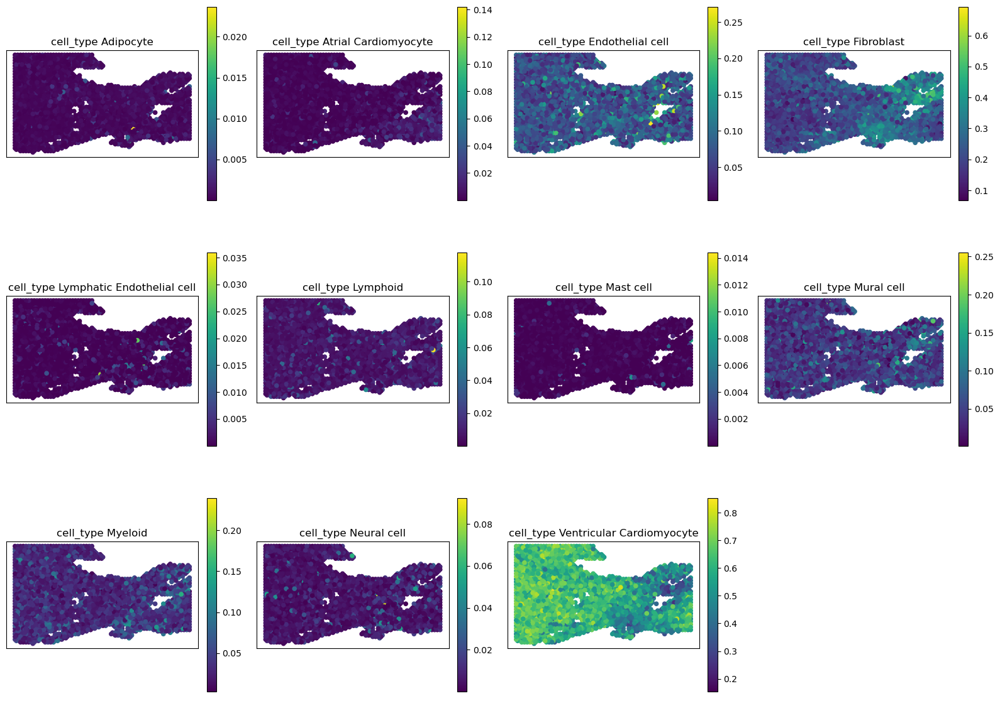

In [ ]:
plot_cell_type_probs_on_spatial(map_tg_adata)

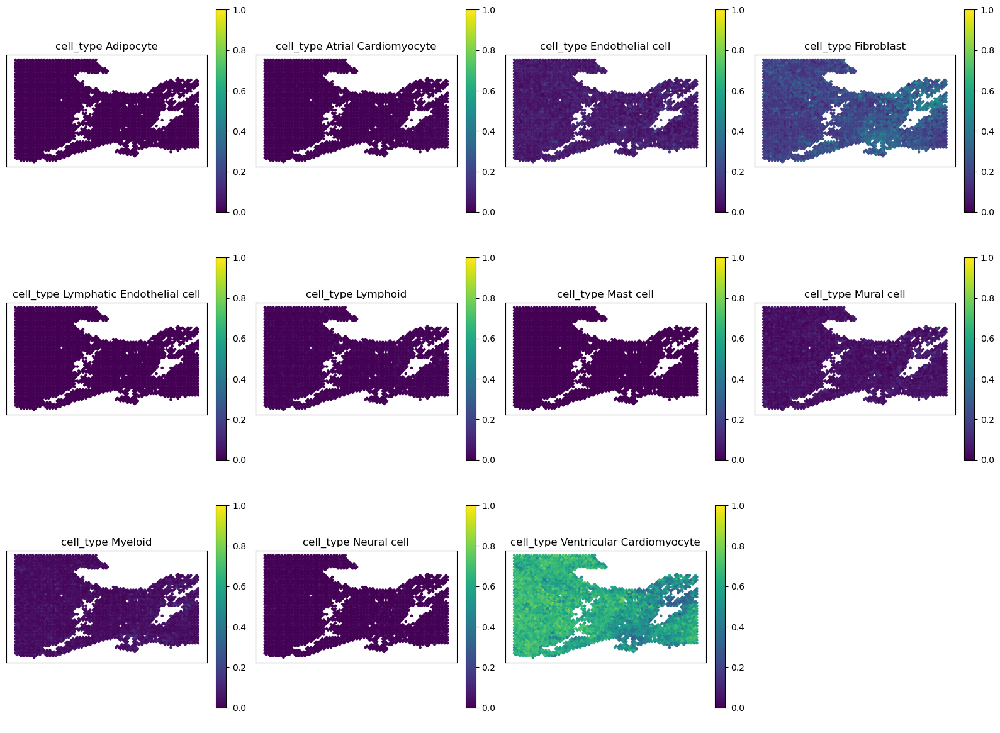

In [145]:
plot_cell_type_probs_on_spatial_shared_axis(map_tg_adata)

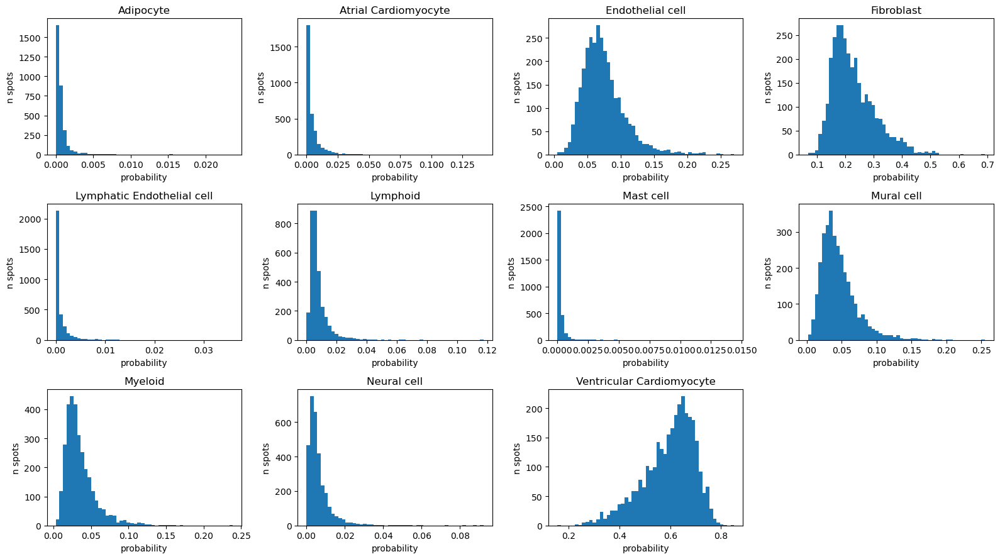

In [43]:
plot_cell_type_probs_on_spatial_histograms(map_tg_adata)

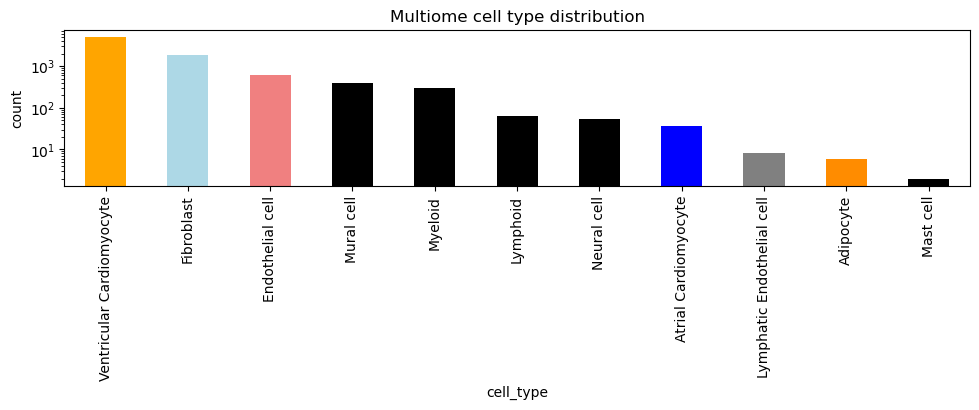

In [56]:
counts = multiome_adata.obs["cell_type"].value_counts()

colors = {
    "Ventricular Cardiomyocyte": "orange",
    "Atrial Cardiomyocyte": "blue",
    "Endothelial cell": "lightcoral",
    "Fibroblast": "lightblue",
    "Lymphoid": "black",
    "Myeloid": "black",
    "Mural cell": "black",
    "Neural cell": "black",
    "Mast cell": "black",
    "Adipocyte": "darkorange",
}

bar_colors = [colors.get(ct, "gray") for ct in counts.index]

counts.plot(kind="bar", figsize=(10, 4), color=bar_colors)
plt.ylabel("count")
plt.xlabel("cell_type")
plt.tight_layout()
plt.yscale("log")  # use log scale if there's a large imbalance in counts
plt.title("Multiome cell type distribution")
plt.show()

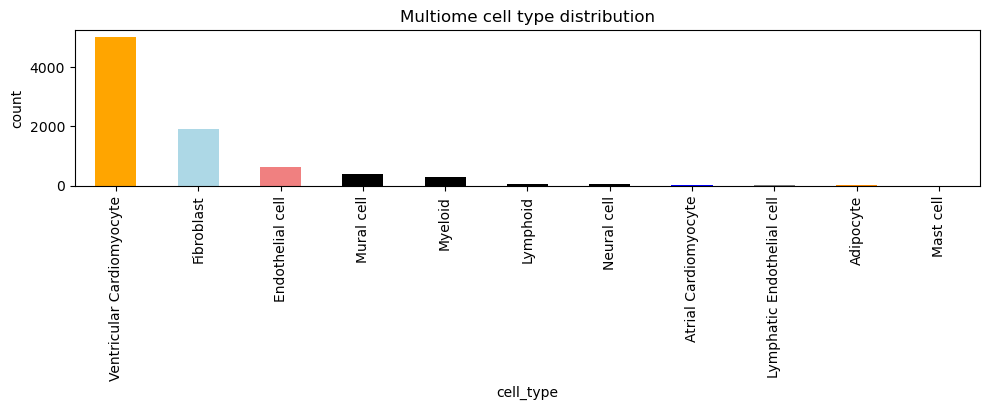

In [55]:
counts = multiome_adata.obs["cell_type"].value_counts()

colors = {
    "Ventricular Cardiomyocyte": "orange",
    "Atrial Cardiomyocyte": "blue",
    "Endothelial cell": "lightcoral",
    "Fibroblast": "lightblue",
    "Lymphoid": "black",
    "Myeloid": "black",
    "Mural cell": "black",
    "Neural cell": "black",
    "Mast cell": "black",
    "Adipocyte": "darkorange",
}

bar_colors = [colors.get(ct, "gray") for ct in counts.index]

counts.plot(kind="bar", figsize=(10, 4), color=bar_colors)
plt.ylabel("count")
plt.xlabel("cell_type")
plt.tight_layout()

plt.title("Multiome cell type distribution")
plt.show()

In [45]:
spatial_adata.obs["cell_type"].value_counts()

cell_type
Ventricular_Cardiomyocyte    2484
Fibroblast                    299
Atrial_Cardiomyocyte          296
Smooth_Muscle                  42
Endothelial                    26
T_cell                          2
Monocyte_Macrophage             2
Adipocyte                       1
Dendritic                       1
Name: count, dtype: int64

In [59]:
w_cell2loc.obs["annotation_final"]

spot_id
HCAHeartST11290662_AAACAACGAATAGTTC-1    myocardium_ventricular
HCAHeartST11290662_AAACAAGTATCTCCCA-1          cardiac_skeleton
HCAHeartST11290662_AAACAATCTACTAGCA-1    myocardium_ventricular
HCAHeartST11290662_AAACACCAATAACTGC-1    myocardium_ventricular
HCAHeartST11290662_AAACAGCTTTCAGAAG-1    myocardium_ventricular
                                                  ...          
HCAHeartST11290662_TTGTTCTAGATACGCT-1    myocardium_ventricular
HCAHeartST11290662_TTGTTTCACATCCAGG-1    myocardium_ventricular
HCAHeartST11290662_TTGTTTCATTAGTCTA-1    myocardium_ventricular
HCAHeartST11290662_TTGTTTCCATACAACT-1    myocardium_ventricular
HCAHeartST11290662_TTGTTTGTGTAAATTC-1    myocardium_ventricular
Name: annotation_final, Length: 3153, dtype: category
Categories (6, object): ['cardiac_skeleton', 'fibrosis', 'myocardium_atrial', 'myocardium_ventricular', 'node', 'vessel']

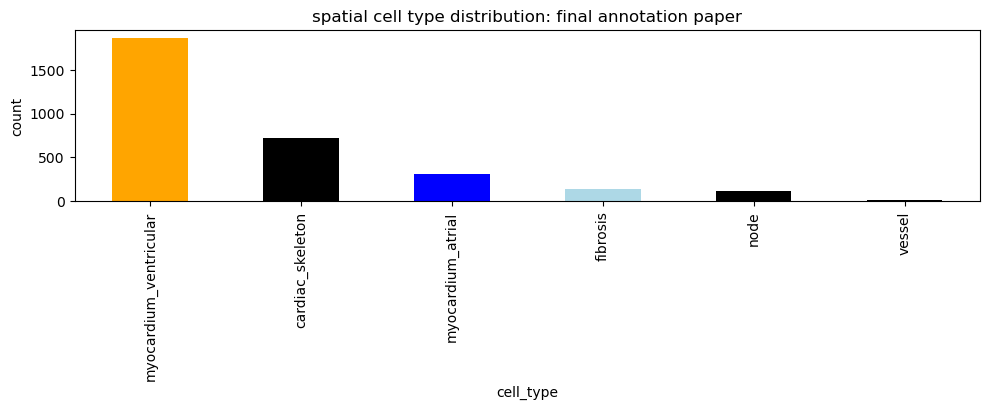

In [85]:
counts = w_cell2loc.obs["annotation_final"].value_counts()

colors = {
    'cardiac_skeleton': 'black',
    'fibrosis': 'lightblue',
    'myocardium_atrial': 'blue',
    'myocardium_ventricular': 'orange',
    'node': 'black',
    'vessel': 'black'
}

bar_colors = [colors.get(ct, "gray") for ct in counts.index]

counts.plot(kind="bar", figsize=(10, 4), color=bar_colors)
plt.ylabel("count")
plt.xlabel("cell_type")
plt.tight_layout()

plt.title("spatial cell type distribution: final annotation paper")
plt.show()

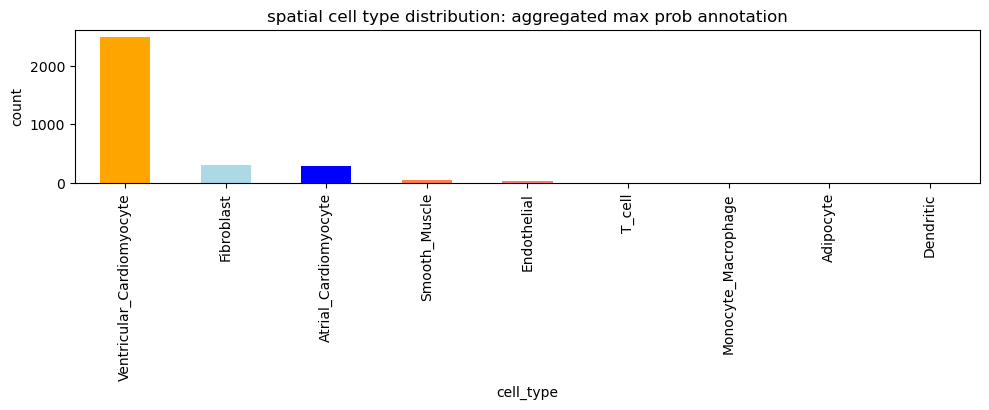

In [86]:
counts = spatial_adata.obs["cell_type"].value_counts()

colors = {
    "Ventricular_Cardiomyocyte": "orange",
    "Atrial_Cardiomyocyte": "blue",
    "Endothelial": "lightcoral",
    "Fibroblast": "lightblue",
    "Adipocyte": "darkorange",
    "Smooth_Muscle": "coral",
    "T_cell": "green",
    "Monocyte_Macrophage": "lightpink",
    "Dendritic": "purple",
}

bar_colors = [colors.get(ct, "gray") for ct in counts.index]

counts.plot(kind="bar", figsize=(10, 4), color=bar_colors)
plt.ylabel("count")
plt.xlabel("cell_type")
plt.tight_layout()

plt.title("spatial cell type distribution: aggregated max prob annotation")
plt.show()

# debug pipeline

In [15]:

def add_dissociated_annotations_to_obs(
    ad_ge,
    pred_key: str = "tangram_ct_pred",
    label_out: str = "cell_type_dissociated",
    prob_prefix: str = "prob_",
    prob_suffix: str = "_dissociated",
    sanitize_names: bool = True,
    add_masked_prob_columns: bool = True,
    mask_obs_key: str = "cell_type",
    masked_sep: str = "__",
):
    if pred_key not in ad_ge.obsm:
        raise KeyError(f"{pred_key!r} not found in ad_ge.obsm")

    ct_pred = ad_ge.obsm[pred_key]

    # Ensure DataFrame with proper index/column names
    if not isinstance(ct_pred, pd.DataFrame):
        ct_pred = pd.DataFrame(ct_pred, index=ad_ge.obs_names)

    ct_pred = ct_pred.copy()
    ct_pred.index = ad_ge.obs_names
    ct_pred.columns = ct_pred.columns.astype(str)

    def _safe_name(x):
        x = str(x)
        if sanitize_names:
            x = re.sub(r"[^0-9a-zA-Z_]+", "_", x).strip("_")
        return x

    # highest-score cell type per spot
    ad_ge.obs[label_out] = ct_pred.idxmax(axis=1).astype("category")

    # probability/score columns per dissociated cell type
    colmap = {}
    for ct in ct_pred.columns:
        ct_name = str(ct)
        ct_safe = _safe_name(ct_name)
        out_col = f"{prob_prefix}{ct_safe}{prob_suffix}"
        ad_ge.obs[out_col] = ct_pred[ct_name].to_numpy()
        colmap[ct_name] = out_col

    ad_ge.uns["dissociated_prob_column_map"] = colmap

    # Optional: create masked columns for plotting by existing spatial annotation
    if add_masked_prob_columns:
        if mask_obs_key not in ad_ge.obs.columns:
            raise KeyError(f"{mask_obs_key!r} not found in ad_ge.obs")

        mask_series = ad_ge.obs[mask_obs_key].astype(str)
        mask_categories = sorted(mask_series.unique())

        masked_colmap = {}
        for mask_ct in mask_categories:
            mask_ct_safe = _safe_name(mask_ct)
            mask = mask_series == mask_ct

            masked_colmap[mask_ct] = {}
            for original_ct_name, prob_col in colmap.items():
                new_col = (
                    f"{prob_col}"
                    f"{masked_sep}{_safe_name(mask_obs_key)}"
                    f"{masked_sep}{mask_ct_safe}"
                )

                vals = ad_ge.obs[prob_col].to_numpy(dtype=float).copy()
                vals[~mask.to_numpy()] = np.nan
                ad_ge.obs[new_col] = vals

                masked_colmap[mask_ct][original_ct_name] = new_col

        ad_ge.uns["dissociated_masked_prob_column_map"] = masked_colmap

    return ad_ge


In [81]:
adata_tg_scores = sc.read('/nfs/home/students/m.back/swarm/backend/uploads/job_1775978541189_mopitas/dumpase1/adata_tg_scores.h5ad')

In [17]:
import re

In [18]:
ad_ge = add_dissociated_annotations_to_obs(
        ad_ge=adata_tg_scores,
        pred_key="tangram_ct_pred",
        label_out="cell_type_dissociated",
        prob_prefix="prob_",
        prob_suffix="_dissociated",
        sanitize_names=True,
        add_masked_prob_columns=True,
        mask_obs_key="cell_type",
    )

In [125]:
def plot_from_pipeline(obj=ad_ge, ct="Fibroblast", key="tangram_ct_pred"):
    # cell-type probabilities: shape (n_spots, n_cell_types)
    
    coords = obj.obs[["array_row", "array_col"]].to_numpy()
    
    fig, ax = plt.subplots()
    
    sc = ax.scatter(
        coords[:, 1], coords[:, 0],
        c=obj.obsm[key][ct],
        s=5,
        cmap="viridis",
        # vmin=0,
        # vmax=1
    )
    # sc = ax.scatter(
    #     coords[:, 1], coords[:, 0],
    #     c=obj.obs[prop_col],
    #     s=5,
    #     cmap="viridis",
    #     vmin=0,
    #     vmax=1
    # )

    ax.set_xticks([])
    ax.set_yticks([])
    plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

In [131]:
def plot_from_pipeline_obs(obj=ad_ge, prop_col="prob_Ventricular_Cardiomyocyte_dissociated"):
    # cell-type probabilities: shape (n_spots, n_cell_types)
    
    coords = obj.obs[["array_row", "array_col"]].to_numpy()
    
    fig, ax = plt.subplots()

    sc = ax.scatter(
        coords[:, 1], coords[:, 0],
        c=obj.obs[prop_col],
        s=5,
        cmap="viridis",
        # vmin=0,
        # vmax=1
    )

    ax.set_xticks([])
    ax.set_yticks([])
    plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

In [121]:
# get numeric matrix (NumPy array) from the DataFrame
ct_pred_matrix = adata_tg_scores.obsm["tangram_ct_pred"].to_numpy()

ct_pred_matrix

array([[2.02552997e+00, 7.70432291e-01, 1.29887727e-02, ...,
        1.33894479e-03, 1.38559086e-01, 1.02643413e-03],
       [1.58597144e+00, 6.01274052e-01, 7.89319487e-03, ...,
        1.36177564e-03, 1.13216369e-01, 1.33943939e-03],
       [1.47662934e+00, 5.90419062e-01, 1.13741152e-02, ...,
        2.10645095e-03, 1.26761339e-01, 1.24011254e-04],
       ...,
       [1.46766078e+00, 5.32412681e-01, 1.10632983e-02, ...,
        2.30303994e-03, 1.22425718e-01, 4.94751774e-04],
       [1.81167266e+00, 6.74159536e-01, 1.15913391e-02, ...,
        1.82564715e-03, 1.38805627e-01, 4.83925003e-04],
       [1.02961667e+00, 3.83577690e-01, 7.45755157e-03, ...,
        1.33851735e-03, 7.28782059e-02, 3.68844572e-04]], shape=(3153, 11))

In [123]:
ct_pred_matrix_norm = ct_pred_matrix / ct_pred_matrix.sum(axis=1, keepdims=True)

In [124]:

template = adata_tg_scores.obsm["tangram_ct_pred"]

adata_tg_scores.obsm["tangram_ct_pred_norm"] = pd.DataFrame(
    ct_pred_matrix_norm,
    index=template.index,
    columns=template.columns
)

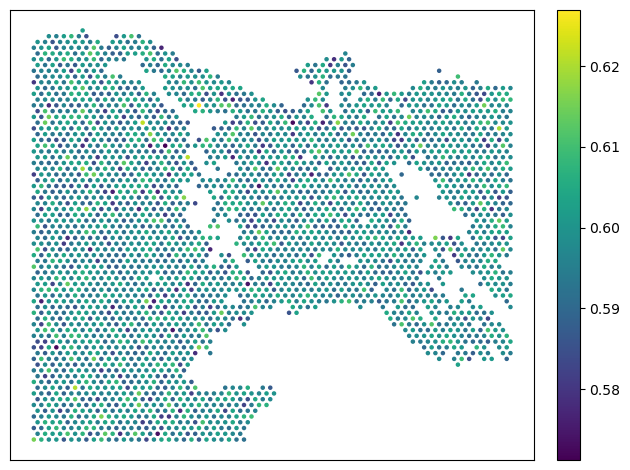

In [127]:

plot_from_pipeline(adata_tg_scores, ct="Ventricular Cardiomyocyte", key="tangram_ct_pred_norm")

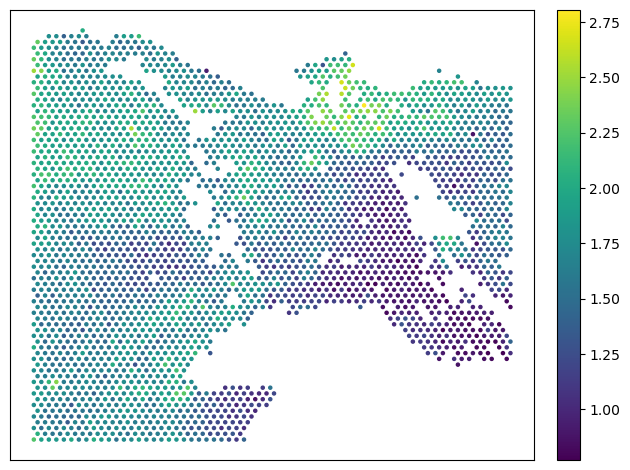

In [114]:

plot_from_pipeline(adata_tg_scores, ct="Ventricular Cardiomyocyte")

In [152]:
adata_tg_scores

AnnData object with n_obs × n_vars = 3153 × 26868
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'annotation_JC', 'sangerID', 'Publication', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'region_cell2loc', 'AVN_P_cell', 'AVN_bundle_cell', 'Adip1', 'Adip2', 'Adip3', 'Adip4', 'B', 'B_plasma', 'CD14+Mo', 'CD16+Mo', 'CD4+T_Tfh', 'CD4+T_Th1', 'CD4+T_Th2', 'CD4+T_act', 'CD4+T_naive', 'CD4+T_reg', 'CD8+T_cytox', 'CD8+T_em', 'CD8+T_te', 'CD8+T_trans', 'DC', 'EC10_CMC-like', 'EC1_cap', 'EC2_cap', 'EC3_cap', 'EC4_immune', 'EC5_art', 'EC6_ven', 'EC7_endocardial', 'EC8_ln', 'EC9_FB-like', 'FB1', 'FB2', 'FB3', 'FB4_activated', 'FB5', 'FB6', 'ILC', 'LYV

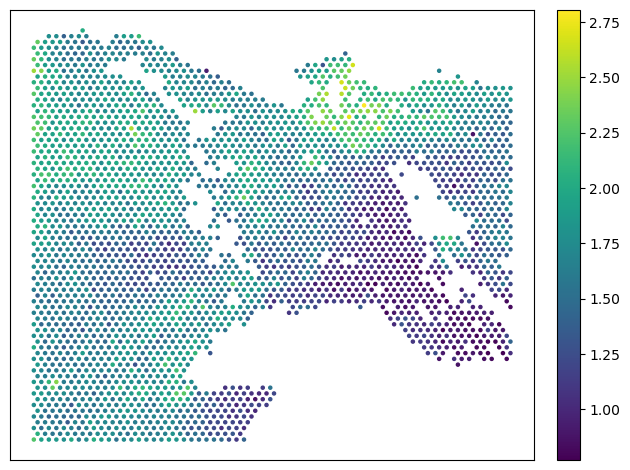

In [154]:
plot_from_pipeline_obs(obj=adata_tg_scores, prop_col="prob_Ventricular_Cardiomyocyte_dissociated")

In [165]:
adata_tg_scores.obs.columns

Index(['in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes',
       ...
       'prob_Fibroblast_dissociated__cell_type__vessel',
       'prob_Atrial_Cardiomyocyte_dissociated__cell_type__vessel',
       'prob_Endothelial_cell_dissociated__cell_type__vessel',
       'prob_Adipocyte_dissociated__cell_type__vessel',
       'prob_Neural_cell_dissociated__cell_type__vessel',
       'prob_Myeloid_dissociated__cell_type__vessel',
       'prob_Lymphoid_dissociated__cell_type__vessel',
       'prob_Lymphatic_Endothelial_cell_dissociated__cell_type__vessel',
       'prob_Mural_cell_dissociated__cell_type__vessel',
       'prob_Mast_cell_dissociated__cell_type__vessel'],
      dtype='object', length=189)

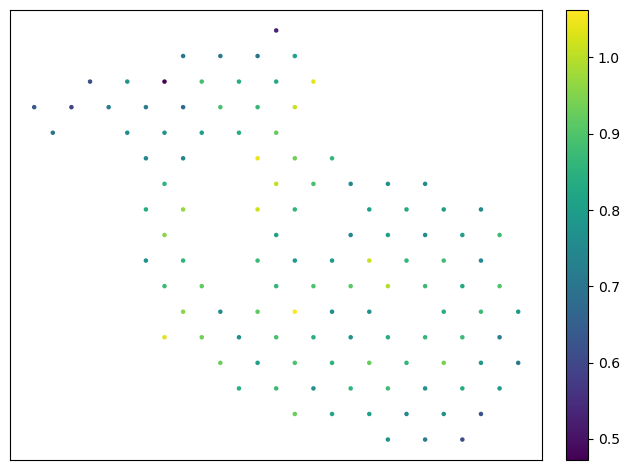

In [158]:
plot_from_pipeline_obs(obj=adata_tg_scores, prop_col="prob_Fibroblast_dissociated__cell_type__node")

In [ ]:
plot_from_pipeline_obs(obj=adata_tg_scores, prop_col="prob_Ventricular_Cardiomyocyte_dissociated")

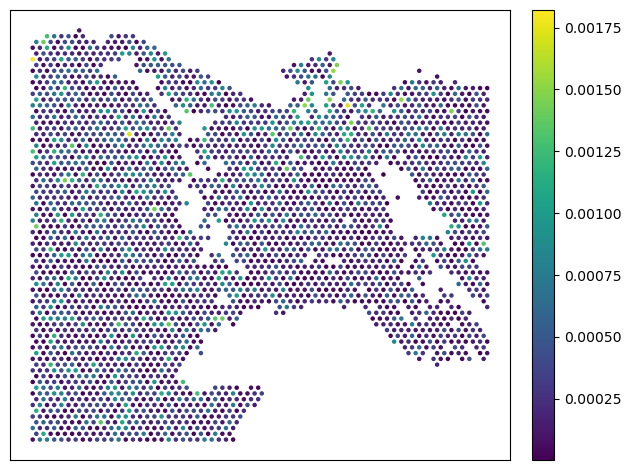

In [133]:
plot_from_pipeline_obs(obj=adata_tg_scores_clusters, prop_col="prob_Fibroblast_dissociated")

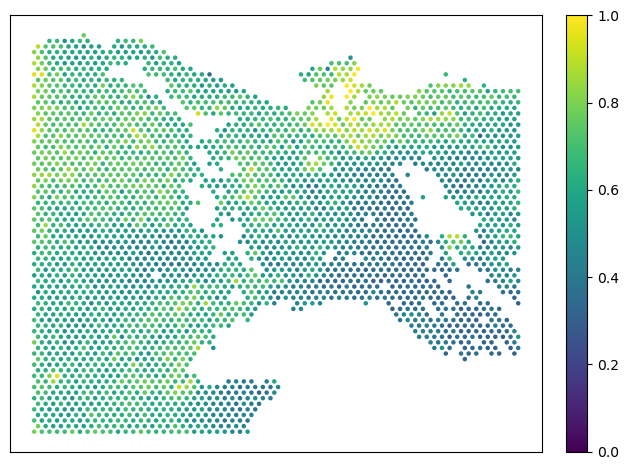

In [129]:
plot_from_pipeline_obs(obj=adata_tg_scores, prop_col="prob_Fibroblast_dissociated")

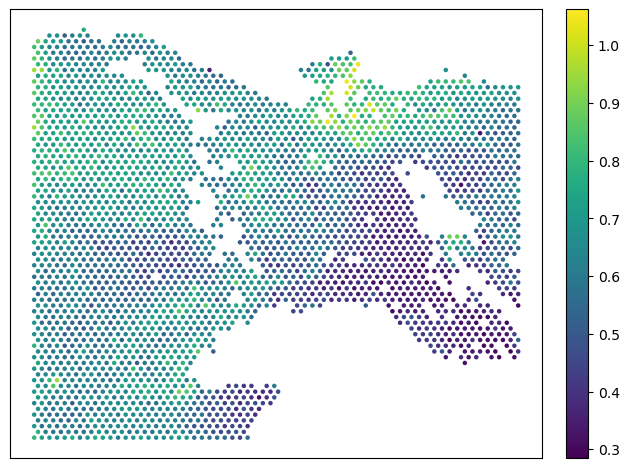

In [111]:

plot_from_pipeline(adata_tg_scores, ct="Fibroblast")

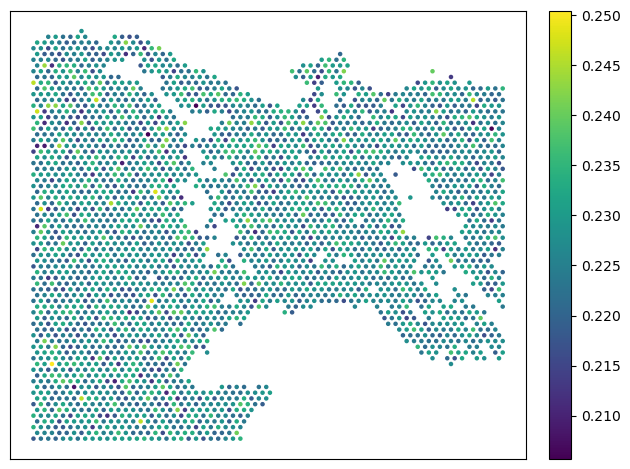

In [128]:

plot_from_pipeline(adata_tg_scores, ct="Fibroblast",key="tangram_ct_pred_norm")

In [106]:
adata_tg_scores_clusters = sc.read("/nfs/home/students/m.back/swarm/backend/uploads/job_1775990237185_mopitas/kackhaufen1/adata_tg_scores.h5ad")

In [135]:
adata_map_clusters = sc.read("/nfs/home/students/m.back/swarm/backend/uploads/job_1775990237185_mopitas/kackhaufen1/adata_map.h5ad")

In [92]:
adata_map_clusters.obs


,cell_type,cluster_density
0,Ventricular Cardiomyocyte,0.596913
1,Fibroblast,0.226490
2,Endothelial cell,0.074659
3,Mural cell,0.045824
4,Myeloid,0.035535
5,Lymphoid,0.007777
6,Neural cell,0.006581
7,Atrial Cardiomyocyte,0.004307
8,Lymphatic Endothelial cell,0.000957
9,Adipocyte,0.000718


In [97]:
row = adata_map_clusters.X[1, :]

# robust für sparse + dense
row_vals = row.toarray().ravel() if sparse.issparse(row) else np.asarray(row).ravel()

pd.Series(row_vals).describe()

count    3153.000000
mean        0.000317
std         0.000296
min         0.000002
25%         0.000091
50%         0.000221
75%         0.000455
max         0.001821
dtype: float64

In [103]:
adata_tg_scores_clusters.obsm["tangram_ct_pred"]["Fibroblast"].describe()

count    3153.000000
mean        0.000317
std         0.000296
min         0.000002
25%         0.000091
50%         0.000221
75%         0.000455
max         0.001821
Name: Fibroblast, dtype: float64

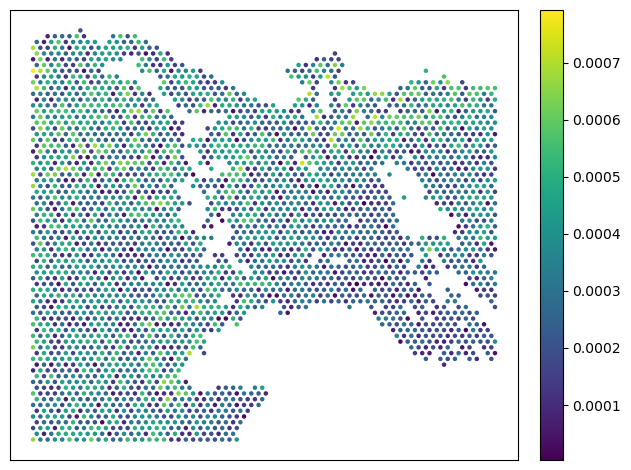

In [113]:
plot_from_pipeline(obj= adata_tg_scores_clusters, ct="Ventricular Cardiomyocyte")

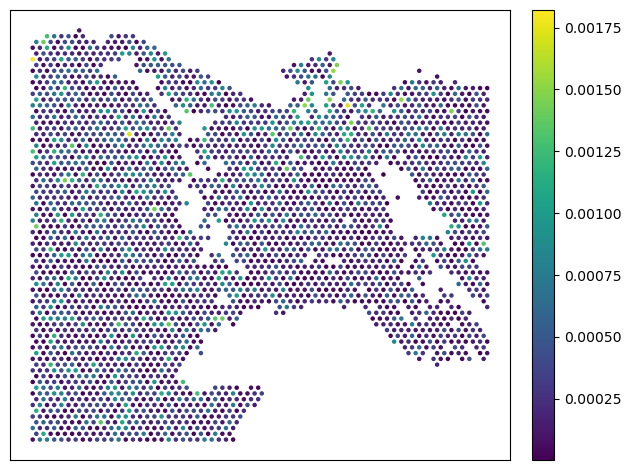

In [112]:
plot_from_pipeline(obj= adata_tg_scores_clusters, ct="Fibroblast")

In [77]:
adata_tg_scores.obsm["tangram_ct_pred_norm"] = (
      adata_tg_scores.obsm["tangram_ct_pred"]
    .div(adata_tg_scores.obsm["tangram_ct_pred"].sum(axis=1), axis=0)
    .fillna(0)
)

In [79]:
adata_tg_scores.obsm["tangram_ct_pred_norm"]["Fibroblast"].describe()

count    3153.000000
mean        0.226463
std         0.006064
min         0.205664
25%         0.222328
50%         0.226359
75%         0.230456
max         0.250463
Name: Fibroblast, dtype: float64

In [ ]:
adata_tg_scores.obs["tangram_ct_pred_FB"].describe()

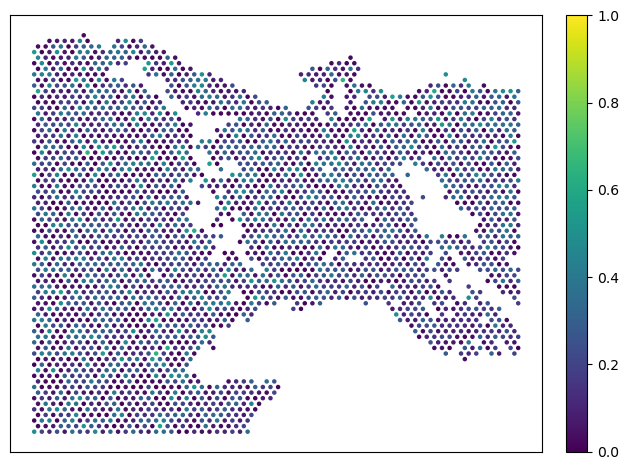

In [69]:
plot_from_pipeline(obj= adata_tg_scores_clusters, prop_col="tangram_ct_pred_vCM")

In [136]:
adata_map_clusters

AnnData object with n_obs × n_vars = 11 × 3153
    obs: 'cell_type', 'cluster_density'
    var: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'annotation_JC', 'sangerID', 'Publication', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'region_cell2loc', 'AVN_P_cell', 'AVN_bundle_cell', 'Adip1', 'Adip2', 'Adip3', 'Adip4', 'B', 'B_plasma', 'CD14+Mo', 'CD16+Mo', 'CD4+T_Tfh', 'CD4+T_Th1', 'CD4+T_Th2', 'CD4+T_act', 'CD4+T_naive', 'CD4+T_reg', 'CD8+T_cytox', 'CD8+T_em', 'CD8+T_te', 'CD8+T_trans', 'DC', 'EC10_CMC-like', 'EC1_cap', 'EC2_cap', 'EC3_cap', 'EC4_immune', 'EC5_art', 'EC6_ven', 'EC7_endocardial', 'EC8_ln', 'EC9_FB-like', 'FB1', 'FB2', 'FB3', 'FB4_

In [138]:
map_tg_adata_mapped = map_dissociated_annos_to_spatial(adata_map, obs_anno_col="cell_type")

In [139]:
map_tg_adata_mapped

AnnData object with n_obs × n_vars = 8358 × 3153
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sangerID', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'scrublet_score', 'scrublet_leiden', 'cluster_scrublet_score', 'doublet_pval', 'doublet_bh_pval', 'batch_key', 'leiden_scVI', 'cell_type', 'cell_state_HCAv1', 'cell_state_scNym', 'cell_state_scNym_confidence', 'cell_state', 'latent_RT_efficiency', 'latent_cell_probability', 'latent_scale', 'n_counts', '_scvi_batch', '_scvi_labels', 'clus20', 'doublet_cls', 'original_or_new', 'batch', 'scANVI_predictions', 'leiden_scArches', 'peak_sangerID', 'peak_combinedID', 'peak_donor', 'peak_donor_type', 'peak_region', 'peak_region_finest', 'peak_age', 'peak_gender', 'peak_facility', 'peak_cell_or_nuclei', 'peak_modality',

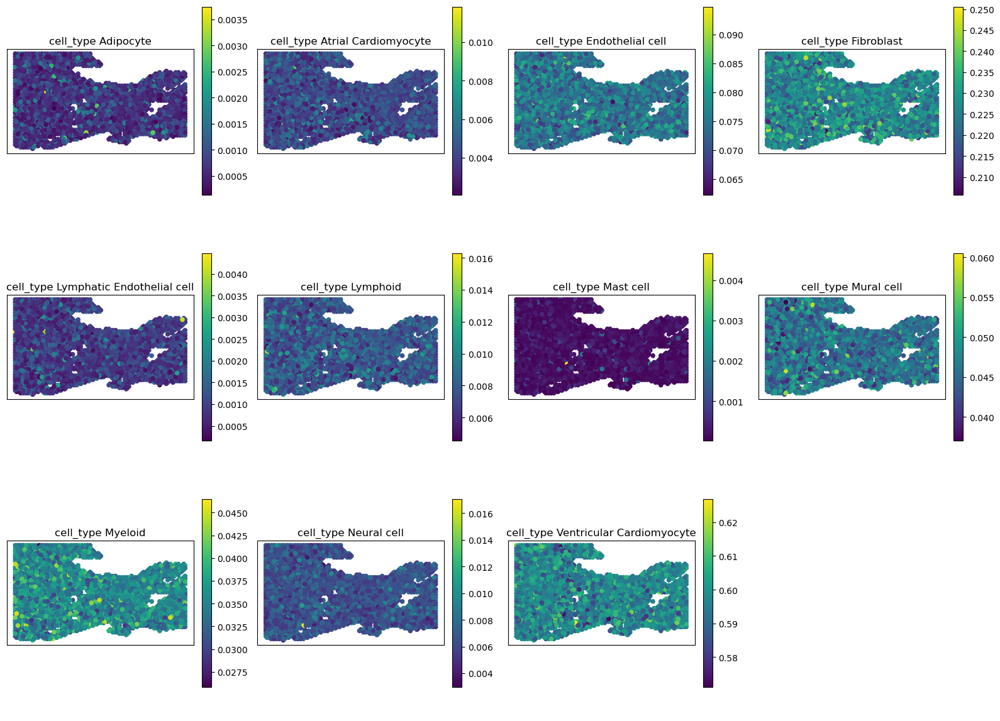

In [142]:
plot_cell_type_probs_on_spatial(map_tg_adata_mapped)

In [146]:

map_tg_adata_mapped_og = map_dissociated_annos_to_spatial(map_tg_og, obs_anno_col="cell_type")

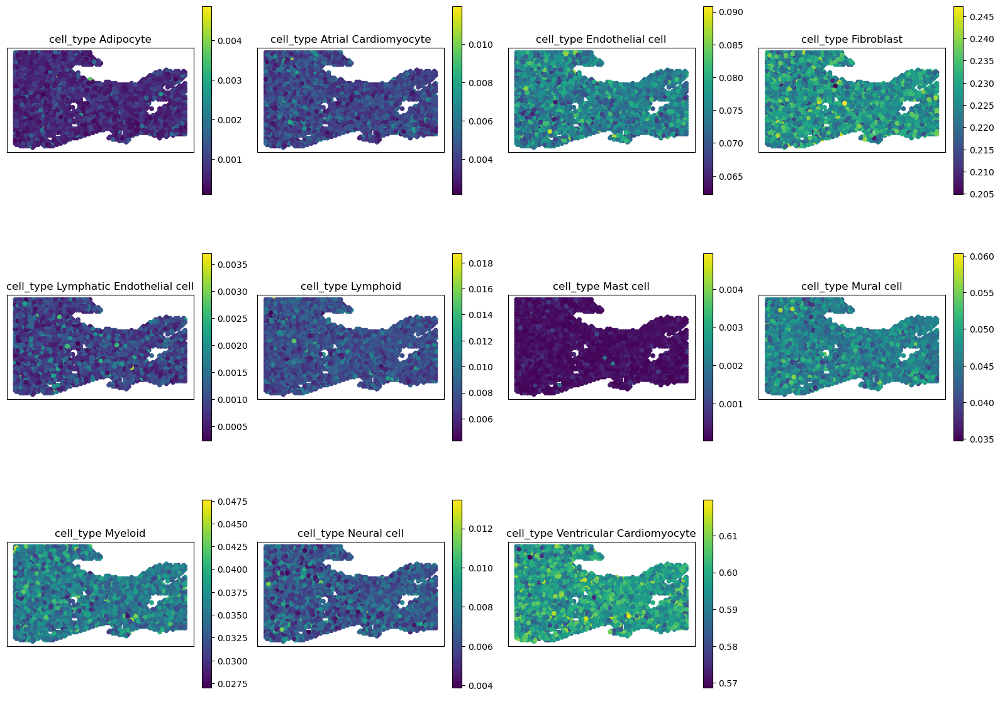

In [147]:
plot_cell_type_probs_on_spatial(map_tg_adata_mapped_og)

In [149]:
base_path = Path("/nfs/home/students/m.back/swarm/backend/uploads/job_1775478088425_mopitas_heart_cellatlas_my_anno")
path_spatial = base_path / "HCAHeartST11290662_adata.h5ad"
multiome_path = base_path / "HCAHeartST11350194_HCAHeartST11445771_peaks_called_clustered.h5ad"
map_tg = base_path / "kackhaufen1/adata_map.h5ad"
map_tg_ogog = sc.read_h5ad(map_tg)

In [150]:

map_tg_adata_mapped_ogog = map_dissociated_annos_to_spatial(map_tg_ogog, obs_anno_col="cell_type")

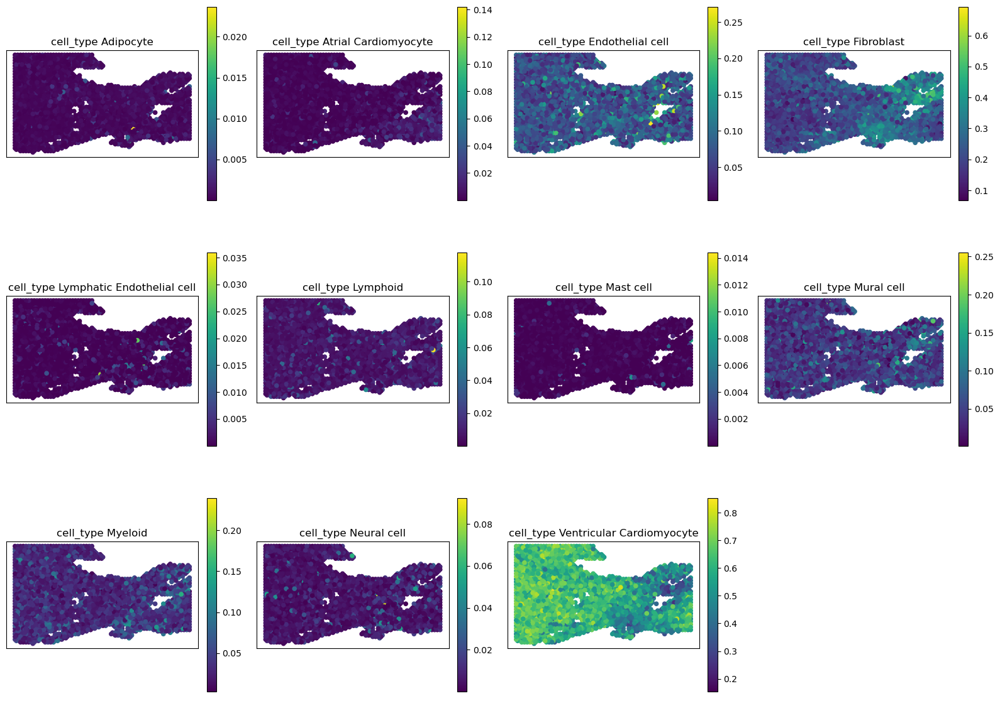

In [151]:
plot_cell_type_probs_on_spatial(map_tg_adata_mapped_ogog)

## redo with old anndata, but with clusters

In [159]:
# why does it work better using my annotation?
# rerun my own anno
base_path = Path("/nfs/home/students/m.back/swarm/backend/uploads/job_1775996629454_mopitas")
path_spatial = base_path / "HCAHeartST11290662_adata.h5ad"
multiome_path = base_path / "HCAHeartST11350194_HCAHeartST11445771_peaks_called_clustered.h5ad"
map_tg = base_path / "dumpase1/adata_map.h5ad"
map_tg_ogog_redo = sc.read_h5ad(map_tg)

In [176]:
multiome_ogog_redo = sc.read_h5ad(multiome_path)

/nfs/home/students/m.back/.conda/envs/mzb_python3.11/lib/python3.11/site-packages/anndata/_io/h5ad.py:266: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  return AnnData(**{


In [181]:
multiome_ogog_redo.obs["cell_type"].value_counts()

cell_type
Ventricular Cardiomyocyte     4989
Fibroblast                    1893
Endothelial cell               624
Mural cell                     383
Myeloid                        297
Lymphoid                        65
Neural cell                     55
Atrial Cardiomyocyte            36
Lymphatic Endothelial cell       8
Adipocyte                        6
Mast cell                        2
Name: count, dtype: int64

In [166]:
tg_ogog_redo = sc.read_h5ad("/nfs/home/students/m.back/swarm/backend/uploads/job_1775996629454_mopitas/dumpase1/adata_tg_scores.h5ad")

In [175]:
tg_ogog_redo.var #prob_Fibroblast_dissociated

,vf_vst_counts_mean,vf_vst_counts_variance,vf_vst_counts_variance.expected,vf_vst_counts_variance.standardized,vf_vst_counts_variable,vf_vst_counts_rank,var.features,var.features.rank,n_cells,is_training
ensg00000238009,0.003470,0.003458,0.003891,0.888762,0,-2147483648,NA,-2147483648,29,True
ensg00000239945,0.000239,0.000239,0.000243,0.982646,0,-2147483648,NA,-2147483648,2,False
ensg00000229905,0.000718,0.000717,0.000759,0.944680,0,-2147483648,NA,-2147483648,6,False
ensg00000237491,0.060541,0.066455,0.072633,0.914948,0,-2147483648,NA,-2147483648,468,True
ensg00000177757,0.001436,0.001673,0.001557,1.074897,0,-2147483648,NA,-2147483648,11,False
...,...,...,...,...,...,...,...,...,...,...
ensg00000278817,0.016511,0.016958,0.019304,0.878483,0,-2147483648,NA,-2147483648,135,True
ensg00000277196,0.002991,0.003222,0.003336,0.965844,0,-2147483648,NA,-2147483648,24,False
ensg00000278384,0.171811,0.204533,0.227779,0.897943,0,-2147483648,NA,-2147483648,1207,True
ensg00000276345,0.000359,0.000359,0.000370,0.969903,0,-2147483648,NA,-2147483648,3,False


In [173]:
tg_ogog_redo.obs["cell_type"]

spot_id
HCAHeartST11290662_AAACAACGAATAGTTC-1    Ventricular_Cardiomyocyte
HCAHeartST11290662_AAACAAGTATCTCCCA-1         Atrial_Cardiomyocyte
HCAHeartST11290662_AAACAATCTACTAGCA-1    Ventricular_Cardiomyocyte
HCAHeartST11290662_AAACACCAATAACTGC-1    Ventricular_Cardiomyocyte
HCAHeartST11290662_AAACAGCTTTCAGAAG-1    Ventricular_Cardiomyocyte
                                                   ...            
HCAHeartST11290662_TTGTTCTAGATACGCT-1    Ventricular_Cardiomyocyte
HCAHeartST11290662_TTGTTTCACATCCAGG-1                   Fibroblast
HCAHeartST11290662_TTGTTTCATTAGTCTA-1    Ventricular_Cardiomyocyte
HCAHeartST11290662_TTGTTTCCATACAACT-1    Ventricular_Cardiomyocyte
HCAHeartST11290662_TTGTTTGTGTAAATTC-1    Ventricular_Cardiomyocyte
Name: cell_type, Length: 3153, dtype: category
Categories (9, object): ['Adipocyte', 'Atrial_Cardiomyocyte', 'Dendritic', 'Endothelial', ..., 'Monocyte_Macrophage', 'Smooth_Muscle', 'T_cell', 'Ventricular_Cardiomyocyte']

In [174]:
adata_tg_scores.obs["cell_type"]

spot_id
HCAHeartST11290662_AAACAACGAATAGTTC-1    myocardium_ventricular
HCAHeartST11290662_AAACAAGTATCTCCCA-1          cardiac_skeleton
HCAHeartST11290662_AAACAATCTACTAGCA-1    myocardium_ventricular
HCAHeartST11290662_AAACACCAATAACTGC-1    myocardium_ventricular
HCAHeartST11290662_AAACAGCTTTCAGAAG-1    myocardium_ventricular
                                                  ...          
HCAHeartST11290662_TTGTTCTAGATACGCT-1    myocardium_ventricular
HCAHeartST11290662_TTGTTTCACATCCAGG-1    myocardium_ventricular
HCAHeartST11290662_TTGTTTCATTAGTCTA-1    myocardium_ventricular
HCAHeartST11290662_TTGTTTCCATACAACT-1    myocardium_ventricular
HCAHeartST11290662_TTGTTTGTGTAAATTC-1    myocardium_ventricular
Name: cell_type, Length: 3153, dtype: category
Categories (6, object): ['cardiac_skeleton', 'fibrosis', 'myocardium_atrial', 'myocardium_ventricular', 'node', 'vessel']

In [172]:
tg_ogog_redo.obs["prob_Fibroblast_dissociated"].describe()

count    3153.000000
mean        0.000317
std         0.000200
min         0.000004
25%         0.000192
50%         0.000267
75%         0.000380
max         0.001605
Name: prob_Fibroblast_dissociated, dtype: float64

In [171]:
adata_tg_scores.obsm["tangram_ct_pred"]["Fibroblast"].describe()

count    3153.000000
mean        0.600381
std         0.133230
min         0.285054
25%         0.516277
50%         0.613137
75%         0.689175
max         1.062150
Name: Fibroblast, dtype: float64

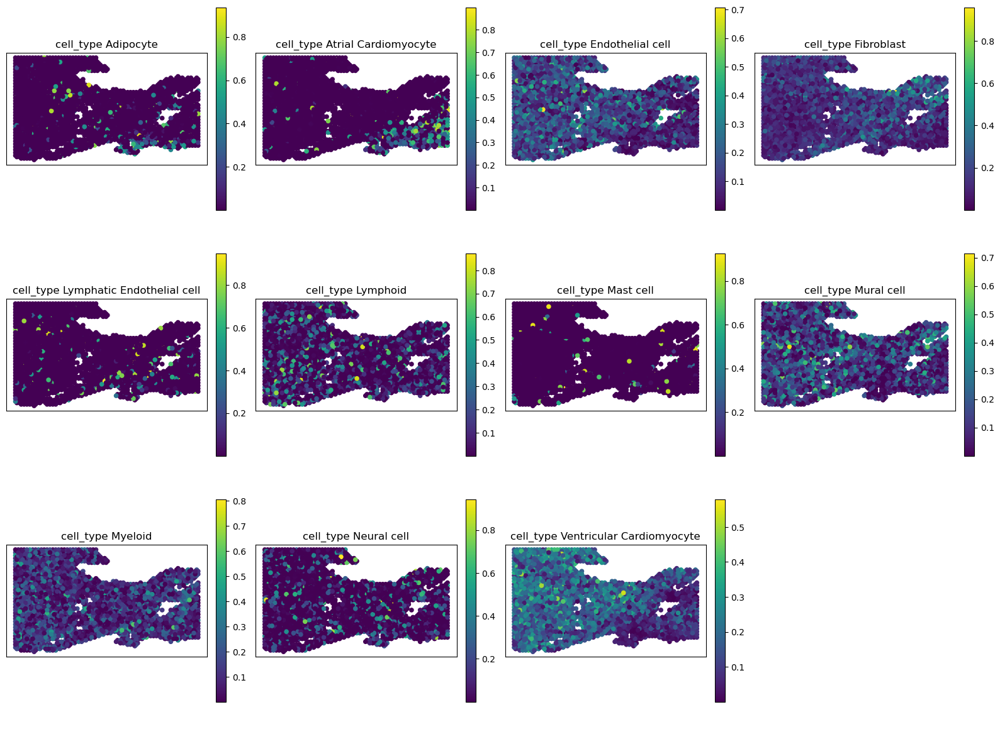

In [160]:

map_tg_ogog_redo_mapped = map_dissociated_annos_to_spatial(map_tg_ogog_redo, obs_anno_col="cell_type")
plot_cell_type_probs_on_spatial(map_tg_ogog_redo_mapped)

In [183]:
adata_tg_scores

AnnData object with n_obs × n_vars = 3153 × 26868
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'annotation_JC', 'sangerID', 'Publication', 'combinedID', 'donor', 'donor_type', 'region', 'region_finest', 'age', 'gender', 'facility', 'cell_or_nuclei', 'modality', 'kit_10x', 'flushed', 'region_cell2loc', 'AVN_P_cell', 'AVN_bundle_cell', 'Adip1', 'Adip2', 'Adip3', 'Adip4', 'B', 'B_plasma', 'CD14+Mo', 'CD16+Mo', 'CD4+T_Tfh', 'CD4+T_Th1', 'CD4+T_Th2', 'CD4+T_act', 'CD4+T_naive', 'CD4+T_reg', 'CD8+T_cytox', 'CD8+T_em', 'CD8+T_te', 'CD8+T_trans', 'DC', 'EC10_CMC-like', 'EC1_cap', 'EC2_cap', 'EC3_cap', 'EC4_immune', 'EC5_art', 'EC6_ven', 'EC7_endocardial', 'EC8_ln', 'EC9_FB-like', 'FB1', 'FB2', 'FB3', 'FB4_activated', 'FB5', 'FB6', 'ILC', 'LYV


- redo with new anndata (my annotation), with single cells, with hvg+ctg+markers
- redo with new anndata (my annotation), with single clusters, with hvg+ctg+markers

- redo with new anndata (final annotation), with single cells, with hvg+ctg+markers
- redo with new anndata (final annotation), with single clusters, with hvg+ctg+markers


In [196]:
adata = sc.read_h5ad("/nfs/home/students/m.back/swarm/backend/data/cell_atlas/renamed_genes/HCAHeartST11290662_adata_final_annotation.h5ad")

In [204]:
adata.var_names = adata.var["SYMBOL"].astype(str)
#adata.var_names_make_unique()

In [206]:
adata.write_h5ad("/nfs/home/students/m.back/swarm/backend/data/cell_atlas/renamed_genes/HCAHeartST11290662_adata_final_annotation.h5ad")

/nfs/home/students/m.back/.conda/envs/mzb_python3.11/lib/python3.11/site-packages/anndata/_io/utils.py:243: FutureWarning: Forward slashes will be disallowed in h5 stores in the next minor release
  return func(*args, **kwargs)


### current run: hvg+ctg+hvg_merit on single cell

In [207]:
base_path = Path("//nfs/home/students/m.back/swarm/backend/uploads/job_1776009725832_mopitas/")
path_spatial = base_path / "HCAHeartST11290662_adata.h5ad"
multiome_path = base_path / "HCAHeartST11350194_HCAHeartST11445771_peaks_called_clustered.h5ad"
adata_tg_scores = base_path / "junkDNA420/adata_tg_scores.h5ad"
map_tg = base_path / "junkDNA420/adata_map.h5ad"
map = sc.read_h5ad(map_tg)

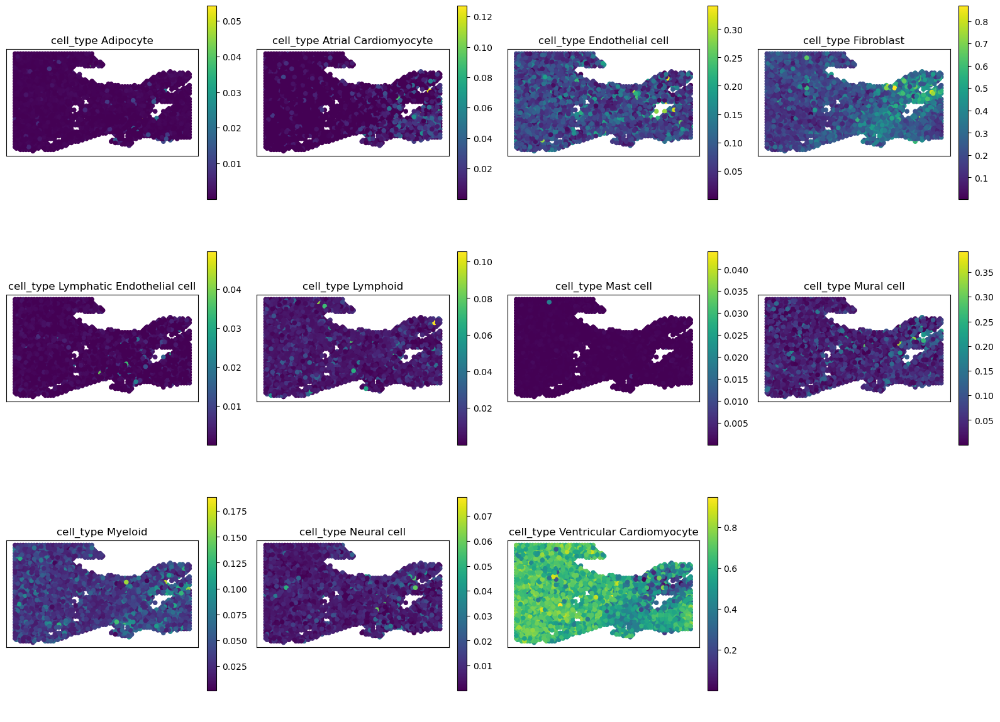

In [ ]:

map_mapped = map_dissociated_annos_to_spatial(map, obs_anno_col="cell_type")
plot_cell_type_probs_on_spatial(map_mapped)

In [212]:
adata_tg_scores = sc.read_h5ad(adata_tg_scores)